# Laboratorio: espacios discretos y continuos en Gymnasium

Este laboratorio compara tres tipos de problemas de aprendizaje por refuerzo usando **Gymnasium** y **Stable-Baselines3**:

1. **FrozenLake**: observaciones discretas + acciones discretas.
2. **LunarLander**: observaciones continuas + acciones discretas.
3. **Pendulum**: observaciones continuas + acciones continuas.

El objetivo principal no es obtener el mejor agente posible, sino observar cómo cambian `observation_space`, `action_space` y el algoritmo apropiado.


## 1. Instalación


In [16]:
#!pip -q uninstall -y dopamine-rl gym
#!pip -q install "gymnasium[box2d,classic-control,toy-text]" stable-baselines3 pygame imageio
import numpy as np

## 2. Importaciones


In [17]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt

from stable_baselines3 import DQN, SAC
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.evaluation import evaluate_policy

## 3. Función auxiliar

Antes de entrenar, inspeccionaremos explícitamente los espacios. `Discrete(n)` representa un conjunto finito de valores; `Box(...)` representa un subconjunto continuo de $\mathbb{R}^n$.


In [18]:
# Esta es una función para describir los diferentes aspectos de un environment cualquiera. Esto es para entender las acciones y el espacio
def describe_env(env_id):
    env = gym.make(env_id)
    print("Entorno:", env_id)
    print("Observation space:", env.observation_space)
    print("Action space:", env.action_space)
    obs, info = env.reset(seed=42)
    print("Observación inicial:", obs)
    print("Acción aleatoria:", env.action_space.sample())
    env.close()


# Caso 1 — FrozenLake: estado discreto + acción discreta

`FrozenLake-v1` funciona como un GridWorld sencillo. El agente ocupa una casilla de la cuadrícula y el estado puede codificarse mediante un entero. Las acciones también forman un conjunto finito: izquierda, abajo, derecha y arriba.

Para que el ejemplo sea más fácil de entrenar usamos `is_slippery=False`, eliminando la aleatoriedad del hielo.

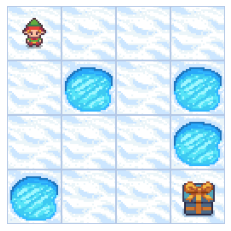

In [19]:
# Descripción del environment que vamos a crear:
describe_env("FrozenLake-v1")

Entorno: FrozenLake-v1
Observation space: Discrete(16)
Action space: Discrete(4)
Observación inicial: 0
Acción aleatoria: 0


### Entrenamiento con DQN

Aunque este problema podría resolverse perfectamente con Q-learning tabular, usamos DQN para mantener la interfaz de Stable-Baselines3 y compararla después con LunarLander. DQN requiere acciones discretas.


In [22]:
env_frozen = Monitor(gym.make("FrozenLake-v1",  map_name="4x4", is_slippery=False))

model_frozen = DQN(
    "MlpPolicy",
    env_frozen,
    learning_rate=1e-4,
    buffer_size=20_000,
    learning_starts=1_000,
    batch_size=64,
    gamma=0.9,
    train_freq=1,
    gradient_steps=1,
    target_update_interval=2_000,
    n_steps=6,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.05,
    exploration_fraction=0.5,
    seed=42,
    verbose=0
)

model_frozen.learn(total_timesteps=20_000, progress_bar=False)

print("Timesteps entrenados:", model_frozen.num_timesteps)
print("Episodios registrados:", len(env_frozen.get_episode_rewards()))
rewards = np.array(env_frozen.get_episode_rewards())
print("Número de episodios:", len(rewards))
print("Éxitos:", int(rewards.sum()))
print("Tasa de éxito:", rewards.mean())
model_frozen.save("dqn_frozen_lake")


Timesteps entrenados: 20000
Episodios registrados: 3047
Número de episodios: 3047
Éxitos: 2179
Tasa de éxito: 0.7151296357072531


In [23]:
# Proceso de carga del ambiente de forma pre-entrenada
model_frozen = DQN.load("dqn_frozen_lake")

In [24]:
#Se crea otro ambiente para evaluar
env_eval = Monitor(gym.make("FrozenLake-v1",map_name="4x4",is_slippery=False))

rewards_eval, lengths_eval = evaluate_policy(model_frozen, env_eval, n_eval_episodes=100, deterministic=True, return_episode_rewards=True)

print("Reward promedio:", np.mean(rewards_eval))
print("Éxitos:", int(np.sum(rewards_eval)), "/ 100")
print("Longitud promedio:", np.mean(lengths_eval))


Reward promedio: 1.0
Éxitos: 100 / 100
Longitud promedio: 6.0


In [25]:
#Miremos los valores que almacena la red neuronal para cada estado y cada accion.
import torch as th
import numpy as np
acciones = ["←", "↓", "→", "↑"]
for state in range(16):
    obs_tensor, _ = model_frozen.policy.obs_to_tensor(state)
    with th.no_grad():
        q_values = model_frozen.q_net(obs_tensor)
    q = q_values.cpu().numpy()[0]
    print(
        f"Estado {state:2d}: "
        f"{dict(zip(acciones, np.round(q, 4)))} "
        f"→ {acciones[np.argmax(q)]}"
    )

Estado  0: {'←': np.float32(0.1882), '↓': np.float32(0.4474), '→': np.float32(0.1637), '↑': np.float32(0.1957)} → ↓
Estado  1: {'←': np.float32(0.1658), '↓': np.float32(0.0099), '→': np.float32(0.2576), '↑': np.float32(0.1328)} → →
Estado  2: {'←': np.float32(0.1342), '↓': np.float32(0.3146), '→': np.float32(0.0933), '↑': np.float32(0.1325)} → ↓
Estado  3: {'←': np.float32(0.145), '↓': np.float32(0.0109), '→': np.float32(0.0441), '↑': np.float32(0.0548)} → ←
Estado  4: {'←': np.float32(0.2185), '↓': np.float32(0.5388), '→': np.float32(0.0032), '↑': np.float32(0.2343)} → ↓
Estado  5: {'←': np.float32(0.3352), '↓': np.float32(0.6449), '→': np.float32(0.1841), '↑': np.float32(0.2714)} → ↓
Estado  6: {'←': np.float32(0.0133), '↓': np.float32(0.573), '→': np.float32(0.0087), '↑': np.float32(0.1837)} → ↓
Estado  7: {'←': np.float32(0.2682), '↓': np.float32(0.5283), '→': np.float32(0.527), '↑': np.float32(0.245)} → ↓
Estado  8: {'←': np.float32(0.3035), '↓': np.float32(0.0105), '→': np.float3

Estados visitados: [0, 4, 8, 9, 13, 14, 15]


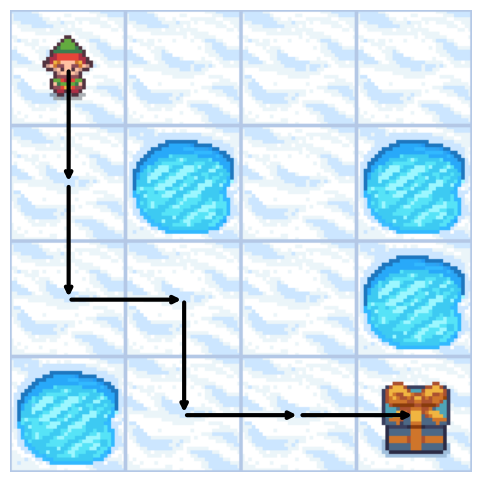

In [26]:
# Observemos una trayectoria aprendida en el modelo
env_frozen = Monitor(gym.make("FrozenLake-v1",  map_name="4x4", is_slippery=False))
obs, info = env_frozen.reset(seed=1)
trajectory = [int(obs)]
terminated = truncated = False
while not (terminated or truncated):
    action, _ = model_frozen.predict(obs, deterministic=True)
    action=int(action)
    obs, reward, terminated, truncated, info = env_frozen.step(action)
    trajectory.append(int(obs))
print("Estados visitados:", trajectory)
env_frozen.close()

env = gym.make("FrozenLake-v1", map_name="4x4", is_slippery=False, render_mode="rgb_array")
env.reset()
frame = env.render()
env.close()

# Dibujar el render
fig, ax = plt.subplots(figsize=(6, 6))

ax.imshow(frame)

# Dimensiones de la imagen renderizada
height, width = frame.shape[:2]

# Tamaño de cada celda
cell_w = width / 4
cell_h = height / 4


def state_to_xy(state):
    """Convierte el número de estado al centro de su celda."""

    row = state // 4
    col = state % 4

    x = (col + 0.5) * cell_w
    y = (row + 0.5) * cell_h

    return x, y


# Dibujar flechas entre estados consecutivos
for s1, s2 in zip(trajectory[:-1], trajectory[1:]):

    x1, y1 = state_to_xy(s1)
    x2, y2 = state_to_xy(s2)

    ax.annotate(
        "",
        xy=(x2, y2),
        xytext=(x1, y1),
        arrowprops=dict(
            arrowstyle="->",
            linewidth=3
        )
    )

ax.axis("off")
plt.show()

# Caso 2 — LunarLander: estado continuo + acción discreta

En `LunarLander-v3` la observación es un vector de variables físicas continuas: posición, velocidad, orientación, velocidad angular y contactos de las patas. Sin embargo, el motor se controla mediante un conjunto discreto de acciones.

Por tanto:

$$\mathcal{S}\subset\mathbb{R}^8, \qquad \mathcal{A}=\{0,1,2,3\}$$

Este es el caso clásico en el que DQN resulta natural: la red recibe un vector continuo y produce un valor $Q(s,a)$ para cada acción discreta.

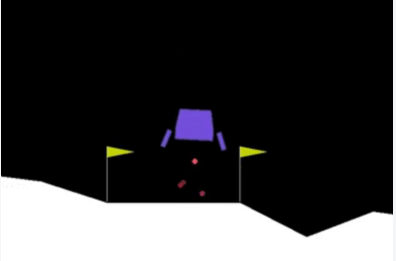

| Índice | Variable de estado | Descripción |
|---|---|---|
| **`0`** | **Posición `x`** | Coordenada horizontal (el objetivo está en `0`). |
| **`1`** | **Posición `y`** | Coordenada vertical. |
| **`2`** | **Velocidad `x`** | Velocidad lineal horizontal. |
| **`3`** | **Velocidad `y`** | Velocidad lineal vertical. |
| **`4`** | **Ángulo** | Orientación o inclinación del módulo en radianes. |
| **`5`** | **Velocidad angular** | Velocidad con la que está rotando el módulo. |
| **`6`** | **Contacto pierna izquierda** | Booleano (`0` o `1`) que indica contacto con el suelo. |
| **`7`** | **Contacto pierna derecha** | Booleano (`0` o `1`) que indica contacto con el suelo. |

In [27]:
describe_env("LunarLander-v3")


Entorno: LunarLander-v3
Observation space: Box([ -2.5        -2.5       -10.        -10.         -6.2831855 -10.
  -0.         -0.       ], [ 2.5        2.5       10.        10.         6.2831855 10.
  1.         1.       ], (8,), float32)
Action space: Discrete(4)
Observación inicial: [ 0.00229702  1.4181306   0.2326471   0.3204666  -0.00265488 -0.05269805
  0.          0.        ]
Acción aleatoria: 1


### Entrenamiento con DQN


In [29]:
from prompt_toolkit.shortcuts import progress_bar
env_lunar = Monitor(gym.make("LunarLander-v3", render_mode="rgb_array"))
model_lunar = DQN(
    "MlpPolicy",
    env_lunar,
    verbose=0,
    learning_rate=1e-3,
    buffer_size=100_000,
    learning_starts=1_000,
    batch_size=64,
    gamma=0.99,
    seed=42,
    exploration_initial_eps=1.0,
    exploration_final_eps=0.05,
    exploration_fraction=0.3,
)
model_lunar.learn(total_timesteps=500_000, progress_bar=False)
model_lunar.save("dqn_lunar_lander_v3")


In [30]:
# Proceso para guardar el modelo que acabamos de entrenar
#model_lunar.save("dqn_lunar_lander_v3")
model_lunar = DQN.load("dqn_lunar_lander_v3")

In [31]:
env_lunar = Monitor(gym.make("LunarLander-v3", render_mode="rgb_array"))
rewards_eval, lengths_eval = evaluate_policy(model_lunar, env_lunar, n_eval_episodes=20, return_episode_rewards=True)
print(f"Reward promedio: {np.mean(rewards_eval):.2f}, Longitud promedio de los episodios{np.mean(lengths_eval):.2f}")
env_lunar.close()


Reward promedio: 208.32, Longitud promedio de los episodios551.75


In [32]:
import gymnasium as gym

env_render = gym.make(
    "LunarLander-v3",
    render_mode="rgb_array"
)

obs, info = env_render.reset(seed=42)

frames = [env_render.render()]
rewards = []

terminated = False
truncated = False

while not (terminated or truncated):

    # Acción según la política aprendida
    action, _ = model_lunar.predict(
        obs,
        deterministic=True
    )

    action = int(action.item())

    obs, reward, terminated, truncated, info = env_render.step(action)

    rewards.append(reward)
    frames.append(env_render.render())

env_render.close()

print("Número de pasos:", len(rewards))
print("Reward total:", sum(rewards))
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(6, 4))

img = ax.imshow(frames[0])
ax.axis("off")


def update(frame):
    img.set_data(frame)
    return [img]


anim = FuncAnimation(
    fig,
    update,
    frames=frames,
    interval=10,
    blit=True
)

plt.close()

HTML(anim.to_jshtml())

Número de pasos: 1000
Reward total: 97.94618772626512


# Caso 3 — Pendulum: estado continuo + acción continua

`Pendulum-v1` tiene observaciones continuas y también una acción continua. El agente controla el torque aplicado al péndulo.

Aquí ya no podemos enumerar todas las acciones posibles. Por ello DQN no es apropiado. Utilizaremos **SAC (Soft Actor-Critic)**, diseñado para espacios de acción `Box`.


In [33]:
describe_env("Pendulum-v1")


Entorno: Pendulum-v1
Observation space: Box([-1. -1. -8.], [1. 1. 8.], (3,), float32)
Action space: Box(-2.0, 2.0, (1,), float32)
Observación inicial: [-0.14995256  0.9886932  -0.12224312]
Acción aleatoria: [-1.1783044]


### Entrenamiento con SAC


In [34]:
env_pendulum = gym.make("Pendulum-v1")
model_pendulum = SAC(
    "MlpPolicy",
    env_pendulum,
    verbose=0,
    learning_rate=3e-4,
    buffer_size=100_000,
    learning_starts=1_000,
    batch_size=256,
    gamma=0.95,
    seed=42
)
model_pendulum.learn(total_timesteps=30_000, progress_bar=False)

model_pendulum.save("SAC_inverted_pendulum")

In [35]:
#model_pendulum.save("SAC_inverted_pendulum")
model_pendulum = SAC.load("SAC_inverted_pendulum")

In [36]:
env_pendulum = gym.make("Pendulum-v1")
mean_reward, std_reward = evaluate_policy(model_pendulum, env_pendulum, n_eval_episodes=20)
print(f"Reward promedio: {mean_reward:.2f} +/- {std_reward:.2f}")
env_pendulum.close()


c:\Users\000010478\Downloads\Curso_TAIA\.venv\Lib\site-packages\stable_baselines3\common\evaluation.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


Reward promedio: -171.80 +/- 81.75


In [37]:
import gymnasium as gym
import numpy as np

env_render = gym.make(
    "Pendulum-v1",
    render_mode="rgb_array"
)

obs, info = env_render.reset(seed=42)

frames = [env_render.render()]
rewards = []

terminated = False
truncated = False

while not (terminated or truncated):

    # Acción continua producida por SAC
    action, _ = model_pendulum.predict(
        obs,
        deterministic=True
    )

    obs, reward, terminated, truncated, info = env_render.step(action)

    rewards.append(reward)
    frames.append(env_render.render())

env_render.close()

print("Número de pasos:", len(rewards))
print("Reward total:", np.sum(rewards))

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(5, 5))

img = ax.imshow(frames[0])
ax.axis("off")

def update(i):
    img.set_data(frames[i])
    return [img]

anim = FuncAnimation(
    fig,
    update,
    frames=len(frames),
    interval=30,
    blit=True
)

plt.close()

HTML(anim.to_jshtml())

Número de pasos: 200
Reward total: -121.78979063821049


# 6. Comparación final

| Entorno | Observation space | Action space | Algoritmo usado |
|---|---|---|---|
| FrozenLake | `Discrete(16)` | `Discrete(4)` | DQN |
| LunarLander | `Box`, vector continuo | `Discrete(4)` | DQN |
| Pendulum | `Box`, vector continuo | `Box`, torque continuo | SAC |

La comparación muestra una idea fundamental: **la continuidad del estado no impide utilizar DQN**. DQN puede recibir observaciones continuas mediante una red neuronal. Su limitación fundamental está en las **acciones**, porque calcula un valor $Q(s,a)$ para cada acción disponible y selecciona la de mayor valor.

Cuando la acción es continua, como en Pendulum, no existe una lista finita sobre la cual calcular directamente `argmax`. Algoritmos actor-critic como SAC aprenden además una política capaz de producir acciones continuas.


## 7. Inspección conjunta de los tres espacios


In [38]:
for env_id in ["FrozenLake-v1", "LunarLander-v3", "Pendulum-v1"]:
    describe_env(env_id)
    print("-" * 70)


Entorno: FrozenLake-v1
Observation space: Discrete(16)
Action space: Discrete(4)
Observación inicial: 0
Acción aleatoria: 2
----------------------------------------------------------------------
Entorno: LunarLander-v3
Observation space: Box([ -2.5        -2.5       -10.        -10.         -6.2831855 -10.
  -0.         -0.       ], [ 2.5        2.5       10.        10.         6.2831855 10.
  1.         1.       ], (8,), float32)
Action space: Discrete(4)
Observación inicial: [ 0.00229702  1.4181306   0.2326471   0.3204666  -0.00265488 -0.05269805
  0.          0.        ]
Acción aleatoria: 0
----------------------------------------------------------------------
Entorno: Pendulum-v1
Observation space: Box([-1. -1. -8.], [1. 1. 8.], (3,), float32)
Action space: Box(-2.0, 2.0, (1,), float32)
Observación inicial: [-0.14995256  0.9886932  -0.12224312]
Acción aleatoria: [1.0494603]
----------------------------------------------------------------------


## Conclusión

Gymnasium estandariza la interacción con el problema mediante `reset()`, `step()` y la definición explícita de los espacios de observación y acción. Stable-Baselines3 implementa los algoritmos que aprenden sobre esa interfaz.

Los tres entornos permiten ver progresivamente la transición desde un MDP completamente discreto hasta un problema de control continuo. El cambio más importante para seleccionar el algoritmo ocurre al pasar de un `action_space=Discrete(...)` a un `action_space=Box(...)`.
